In [1]:
#Suite insight 1
#Nous allons nous concentrer davantage sur les localisations de prise et de fin de charge du client.
#Afin de potentiellement ajouter des variables ou potentielemment en retirer 
#en espérant que certaines localisations induisent des valeurs de pourboire elevé ou faible

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import pyarrow.parquet as pq

In [3]:

"""
pip install geopy geozone geodatasets
"""

'\npip install geopy geozone geodatasets\n'

In [4]:
X_train = pd.read_parquet("../nyc_tips/train.parquet")
X_test = pd.read_parquet("../nyc_tips/test.parquet")

<Axes: ylabel='tip_amount'>

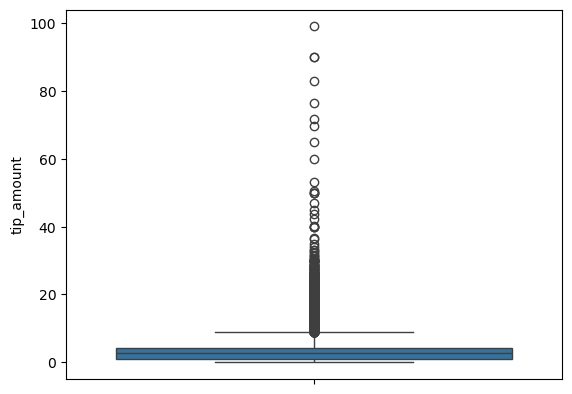

In [139]:
sns.boxplot(y='tip_amount', data=X_train)

In [5]:
#Abordons la mta_tax
X_train['mta_tax'].value_counts()

mta_tax
0.5    99463
0.0      537
Name: count, dtype: int64

In [6]:
X_test['mta_tax'].value_counts()
"""
Meme propotions de valeurs égales à 0.5 (>95% environ). Est-ce que des valeurs inconnues comme 
la valeur 4 empêche peut-être de généraliser le modèle
"""


'\nMeme propotions de valeurs égales à 0.5 (>95% environ). Est-ce que des valeurs inconnues comme \nla valeur 4 empêche peut-être de généraliser le modèle\n'

<Axes: ylabel='tip_amount'>

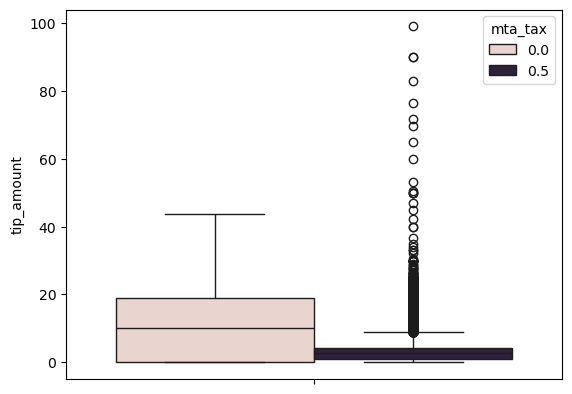

In [7]:
import seaborn as sns
sns.boxplot(y='tip_amount', data=X_train, hue='mta_tax')

#Difficile d'établir une différence significative. 99.5% payent la mta_tax mais pas forcément un lien de cause à effet 
#En plus il y a une valeur inconnue 4 qui va peut-être empeecher de généraliser le modèle
#A supprimer ??

<Axes: ylabel='tip_amount'>

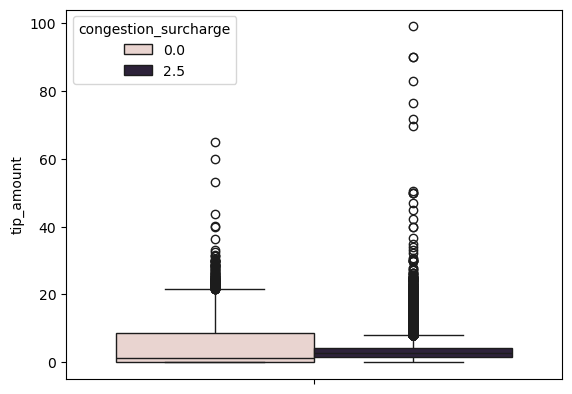

In [121]:
sns.boxplot(y='tip_amount', data=X_train, hue='congestion_surcharge')

In [123]:
X_train['congestion_surcharge'].value_counts()

congestion_surcharge
2.5    93405
0.0     6595
Name: count, dtype: int64

In [8]:
#Payment_type

X_train['payment_type'].value_counts()

#15% payent en cash( valeur 2).
#On a tendance à penser que les gens payant en cash ont tendance à laisser plus souvent un pourboire


payment_type
1    83406
2    15377
4      850
3      367
Name: count, dtype: int64

C:\Users\rober\AppData\Local\Temp\ipykernel_39440\2822887964.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='payment_type', y='tip_amount', data=X_train, palette='Set2')


<Axes: xlabel='payment_type', ylabel='tip_amount'>

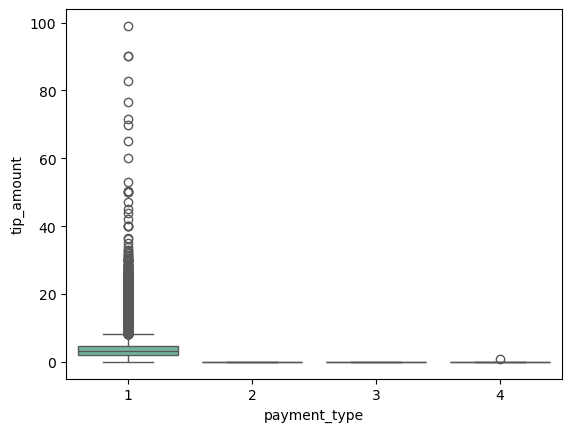

In [9]:
import seaborn as sns
sns.boxplot(x='payment_type', y='tip_amount', data=X_train, palette='Set2')

#Tendance non confirméee. On garde pour l'instant cette variable

In [10]:
#Congestion surcharge

X_train['congestion_surcharge'].value_counts()

congestion_surcharge
2.5    93405
0.0     6595
Name: count, dtype: int64

In [11]:
X_test['congestion_surcharge'].value_counts()
#La valeur 1 apparait 2 fois dans les données de test

#Une valeur jamais rencontrée dans les données d'entrainement

congestion_surcharge
2.5    2451668
0.0     175493
1.0          2
Name: count, dtype: int64

In [12]:
X_test[X_test['congestion_surcharge']==1]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,payment_type,fare_amount,extra,mta_tax,tolls_amount,improvement_surcharge,congestion_surcharge,Airport_fee,PU_location_lat,PU_location_lon,DO_location_lat,DO_location_lon
row_ID,,,,,,,,,,,,,,,,,,,
1863042,1,2024-01-23 20:00:56,2024-01-23 20:12:07,2.0,1.8,1.0,N,1,12.8,1.0,4.0,0.00,0.0,1.0,0.0,40.782477,-73.965555,40.765484,-73.954739
2387235,1,2024-01-26 20:48:20,2024-01-26 21:16:59,1.0,8.9,1.0,N,1,39.4,1.0,4.0,6.94,0.0,1.0,0.0,40.773633,-73.981532,40.670374,-73.981414


In [13]:
"""
#On va tester en supprimant parce que la congestion surcharge est inversement lieé à la longitude, la latitude 
et d'après nos informations
#https://www.nyc.gov/site/tlc/about/congestion-surcharge.page

Donc la congestion_surcharge est liée à la localisation du pickup et du dropoff

#D'ou vient la valeur 1 qui apparait seulement dans les données de test ?
"""

"\n#On va tester en supprimant parce que la congestion surcharge est inversement lieé à la longitude, la latitude \net d'après nos informations\n#https://www.nyc.gov/site/tlc/about/congestion-surcharge.page\n\nDonc la congestion_surcharge est liée à la localisation du pickup et du dropoff\n\n#D'ou vient la valeur 1 qui apparait seulement dans les données de test ?\n"

In [14]:
X_train['Airport_fee'].value_counts()

Airport_fee
0.00    91951
1.75     8049
Name: count, dtype: int64

In [15]:
X_test['Airport_fee'].value_counts()

Airport_fee
0.00    2413176
1.75     213987
Name: count, dtype: int64

In [16]:
"""
pip install folium matplotlib mapclassify
"""

'\npip install folium matplotlib mapclassify\n'

In [17]:
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd

# les trajets concernées par les "Airport fees"
pu_location = X_train[X_train['Airport_fee'] != 0.0][['PU_location_lat', 'PU_location_lon']]
do_location = X_train[X_train['Airport_fee'] != 0.0][['DO_location_lat', 'DO_location_lon']]


geometry_pu = [Point(xy) for xy in zip(pu_location['PU_location_lon'], pu_location['PU_location_lat'])]
geometry_do = [Point(xy) for xy in zip(do_location['DO_location_lon'], do_location['DO_location_lat'])]


gdf_pu = gpd.GeoDataFrame(pu_location, geometry=geometry_pu, crs="EPSG:4326")
gdf_do = gpd.GeoDataFrame(do_location, geometry=geometry_do, crs="EPSG:4326")


gdf_pu.explore()


#Il y a trois aéroports 




In [18]:
gdf_do.explore()



In [19]:
pu_location.value_counts()

#Parmi les 3 premiers, on a 2 aéoports : JFK et la Guardia

PU_location_lat  PU_location_lon
40.646985        -73.786530         4588
40.774376        -73.873628         3070
40.763352        -73.868395          375
40.740674        -73.840865            4
40.757312        -73.885317            2
40.662186        -73.764505            1
40.678953        -73.790987            1
40.694428        -73.790965            1
40.723995        -73.902331            1
40.726155        -73.863338            1
40.745379        -73.948892            1
40.749914        -73.970443            1
40.775932        -73.946510            1
40.780436        -73.957012            1
40.788193        -73.815657            1
Name: count, dtype: int64

In [20]:
do_location.value_counts()

# Parmi les 3 premiers, 2 endroits non loins de Times Square, on a l'Empire state building, d'après nos informations.
#Des endroits plus prisés...mais sont-elles liées à des pourboires plus élevés?

DO_location_lat  DO_location_lon
40.759818        -73.984197         423
40.758028        -73.977698         230
40.748575        -73.985156         199
40.762253        -73.989845         197
40.756688        -73.972356         164
                                   ... 
40.661622        -73.968914           1
40.586555        -74.132985           1
40.586786        -74.085512           1
40.618768        -74.073703           1
40.528686        -74.187679           1
Name: count, Length: 235, dtype: int64

In [43]:
"""
New York compte 3 aéroports
Concernant l'Airport fee, on remarque que parmi les trajets ayant une Airport_fee
La Guardia est la 2e localisation la plus relevée parmi les "pickup" (<5% du total)
Le JFK Airport est la 1e localisation la plus relevée parmi les "pickup" (>25% du total)


Cependant, cela dénote avec ce qu'on a obtenu comme information ici :https://www.nyc.gov/site/tlc/passengers/taxi-fare.page
Apparemment les "Airport_fee" concernent ceux qui démarrent ou terminent leur trajet à un aéroport, ce qui n'est pas le cas.
Quid de cette variable
#On remarque que des trajets concernant l'Airport fee n'ont pas d'aéroport comme point de départ ni d'arrivée
#On ne peut donc résumer l'information "Airport_fee" par les données de localisation du "Dropout" ni du "Pickup"


#Les trajets donc l'"Airport _fee" ne sont pas tous liés à des trajets dont la destination ou le départ est un aéroport 

#Cependant, Les trajets contenant un "Airport_fee" nous montrent que des lieux de pickup et de dropoff les plus fréquentés sont les aéroports
et lieux historiques (Times Square, Empire State Building). L'implication de ces lieux entrainent-ils un pourboire plus éleveé?

"""



'\nNew York compte 3 aéroports\nConcernant l\'Airport fee, on remarque que parmi les trajets ayant une Airport_fee\nLa Guardia est la 2e localisation la plus relevée parmi les "pickup" (<5% du total)\nLe JFK Airport est la 1e localisation la plus relevée parmi les "pickup" (>25% du total)\n\n\nCependant, cela dénote avec ce qu\'on a obtenu comme information ici :https://www.nyc.gov/site/tlc/passengers/taxi-fare.page\nApparemment les "Airport_fee" concernent ceux qui démarrent ou terminent leur trajet à un aéroport, ce qui n\'est pas le cas.\nQuid de cette variable\n#On remarque que des trajets concernant l\'Airport fee n\'ont pas d\'aéroport comme point de départ ni d\'arrivée\n#On ne peut donc résumer l\'information "Airport_fee" par les données de localisation du "Dropout" ni du "Pickup"\n\n\n#Les trajets donc l\'"Airport _fee" ne sont pas tous liés à des trajets dont la destination ou le départ est un aéroport \n\n#Cependant, Les trajets contenant un "Airport_fee" nous montrent que 

In [45]:
#Les trajets non concernés par la 'congestion_surcharge', payée par ceux dont les trajets débutent, passent ou finissent dans cette zone



pu_location = X_train[X_train['congestion_surcharge'] == 0.0][['PU_location_lat', 'PU_location_lon']]

geometry = [Point(xy) for xy in zip(pu_location['PU_location_lon'], pu_location['PU_location_lat'])]

gdf = gpd.GeoDataFrame(pu_location, geometry=geometry, crs="EPSG:4326")

gdf.explore()

In [46]:

do_location = X_train[X_train['congestion_surcharge'] == 0.0][['DO_location_lat', 'DO_location_lon']]

geometry = [Point(xy) for xy in zip(do_location['DO_location_lon'], do_location['DO_location_lat'])]
gdf = gpd.GeoDataFrame(do_location, geometry=geometry, crs="EPSG:4326")

gdf.explore()

In [47]:
"""
Plusieurs éléments ne concordent pas:
https://www.nyc.gov/site/tlc/about/congestion-surcharge.page
Plusieurs trajets démarrant ou terminant dans la congestion zone ont une congestion surcharge égale à 0.
On ne peut donc pas résumer l'information congestion surcharge à la localisation du point de départ ou d'arrivée
En plus la valeur 1 apparait 2 fois  dans les données de test. Pas compatible avec l'article.
Laissons la variable tel quel
"""


"\nPlusieurs éléments ne concordent pas:\nhttps://www.nyc.gov/site/tlc/about/congestion-surcharge.page\nPlusieurs trajets démarrant ou terminant dans la congestion zone ont une congestion surcharge égale à 0.\nOn ne peut donc pas résumer l'information congestion surcharge à la localisation du point de départ ou d'arrivée\nEn plus la valeur 1 apparait 2 fois  dans les données de test. Pas compatible avec l'article.\nLaissons la variable tel quel\n"

"\nC'est dommage car on semble voir une claire différence entre ceux payant les frais d'aéroport et ne les payant pas\nDifficile de montrer une différence statistique car 92% ne payent pas d'Airport fee\nOn souhaitait faire un test statistiques type ANOVA mais une différence d'effectif et de moyenne trop importante\n"

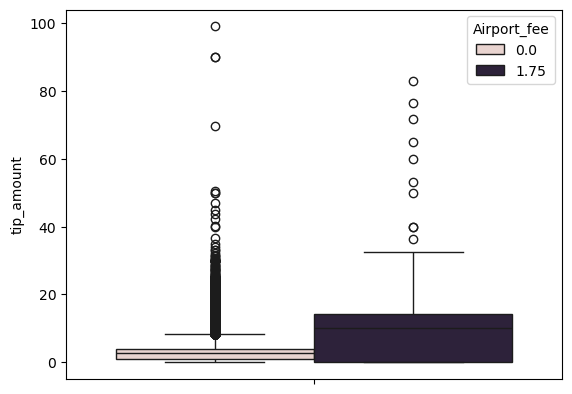

In [48]:
sns.boxplot(y='tip_amount', data=X_train, hue='Airport_fee')
"""
C'est dommage car on semble voir une claire différence entre ceux payant les frais d'aéroport et ne les payant pas
Difficile de montrer une différence statistique car 92% ne payent pas d'Airport fee
On souhaitait faire un test statistiques type ANOVA mais une différence d'effectif et de moyenne trop importante
"""

In [49]:
X_train[['PU_location_lat', 'PU_location_lon']].value_counts()

#Times square, Central Park, JFK ( à vérifier tous ça)

PU_location_lat  PU_location_lon
40.758028        -73.977698         5081
40.768615        -73.965635         5076
40.646985        -73.786530         4822
40.780436        -73.957012         4803
40.759818        -73.984197         3791
                                    ... 
40.762738        -73.773421            1
40.619619        -74.013802            1
40.783333        -73.785973            1
40.600324        -74.071770            1
40.899528        -73.906988            1
Name: count, Length: 223, dtype: int64

In [51]:
X_train[['DO_location_lat', 'DO_location_lon']].value_counts()

# Proche Metropolitan Museum of Art , Central Park(Manhattan), Times Square,




DO_location_lat  DO_location_lon
40.780436        -73.957012         5004
40.768615        -73.965635         4666
40.758028        -73.977698         3825
40.783961        -73.978632         3102
40.773633        -73.981532         3091
                                    ... 
40.571769        -74.105019            1
40.778559        -73.923086            1
40.617971        -74.087839            1
40.561994        -74.122583            1
40.631308        -74.167234            1
Name: count, Length: 243, dtype: int64

In [52]:
X_test[['DO_location_lat', 'DO_location_lon']].value_counts()

#correspondant aux memes localisations que le X_train

DO_location_lat  DO_location_lon
40.780436        -73.957012         130175
40.768615        -73.965635         119683
40.758028        -73.977698         101999
40.759818        -73.984197          81747
40.773633        -73.981532          81517
                                     ...  
40.838550        -73.894986             10
40.552659        -74.188485              9
40.525491        -74.233535              5
40.616746        -73.831300              4
40.576773        -74.186421              1
Name: count, Length: 258, dtype: int64

In [53]:
X_test[['PU_location_lat', 'PU_location_lon']].value_counts()

#correspondant aux 3 premiers de X_train mais pos dans le même ordre

PU_location_lat  PU_location_lon
40.768615        -73.965635         131735
40.758028        -73.977698         131039
40.646985        -73.786530         127309
40.780436        -73.957012         124463
40.756688        -73.972356          98238
                                     ...  
40.618768        -74.073703              1
40.688784        -74.019073              1
40.561994        -74.122583              1
40.791133        -73.882658              1
40.638973        -74.102314              1
Name: count, Length: 251, dtype: int64

In [77]:
"""
L'idée est de créer une variable in_airport proche d'un aéroport """



"\nL'idée est de créer une variable in_airport proche d'un aéroport "

In [79]:

# Coordonnées géographiques des 3 aéroports
airports = [(40.646985, -73.786530), (40.69183, -74.174002), (40.774376, -73.873628)]


def is_airport(row):
    for airport in airports:
        lat, lon = airport
        if (lat - 2*0.0005 <= row['PU_location_lat'] <= lat + 2*0.0005 and
            lon - 2*0.0005 <= row['PU_location_lon'] <= lon + 2*0.0005) or (
            lat - 2*0.0005 <= row['DO_location_lat'] <= lat + 2*0.0005 and
            lon - 2*0.0005 <= row['DO_location_lon'] <= lon + 2*0.0005):
            return 1
    return 0

X_train['airport'] = X_train.apply(is_airport, axis=1)


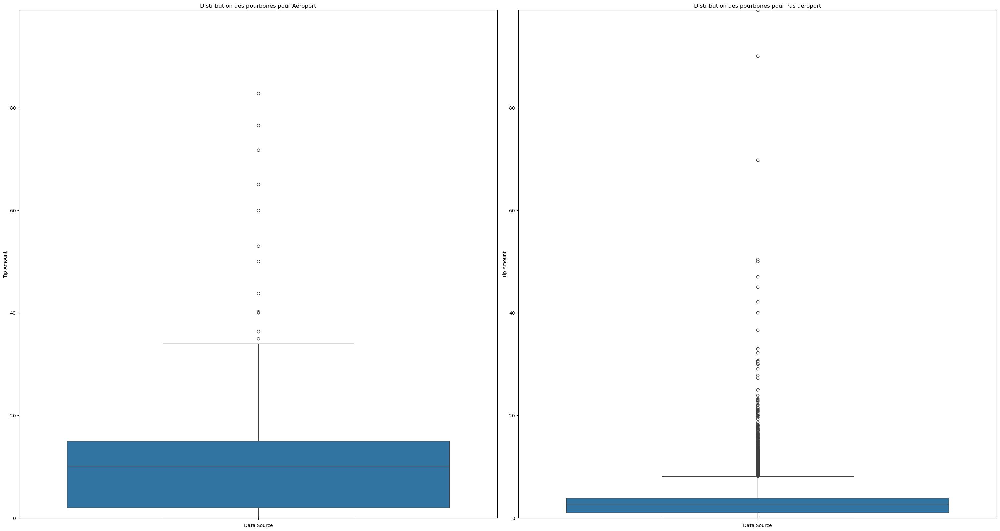

In [80]:
airport_trajet=X_train[X_train['airport']==1]
no_airport_trajet=X_train[X_train['airport']==0]


fig, axes = plt.subplots(1, 2, figsize=(30, 16))
axes = axes.flatten()


data_cmp = [airport_trajet,no_airport_trajet,X_train]

for i, ax in enumerate(axes):
    sns.boxplot(y='tip_amount', data=data_cmp[i], ax=ax)
    ax.set_title('Distribution des pourboires pour ' + (['Aéroport', 'Pas aéroport'][i]))
    ax.set_ylabel('Tip Amount')
    ax.set_xlabel('Data Source')


y_min = min(data_cmp[1]['tip_amount'].min(), data_cmp[0]['tip_amount'].min())
y_max = max(data_cmp[1]['tip_amount'].max(), data_cmp[0]['tip_amount'].max())
for ax in axes:
    ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

In [81]:
X_train['tip_per_km'] = X_train['tip_amount']/X_train['trip_distance']

In [82]:
print(X_train[X_train['airport']==0]['tip_per_km'].mean())

print(X_train[X_train['airport']==1]['tip_per_km'].mean())

#A modérer avec le pourboire par km. De plus , établir une différence significative avec ça alors que tu as vu au niveau de la moyenne par km.
#C'est tout l'inverse. Cette variable semble n'avoir aucun intérêt

2.1273691690453287
1.5881437529358369


In [83]:


#En revanche, cela met en lumière que les lieux historiques et monuments sont très demandés lors des trajets en taxi notamment
#dans le quartier de Manhattan. Jetons un oeil sur les 10 endroits les conocernés par les dropoff


import geopandas as gpd
import matplotlib.pyplot as plt
import geodatasets


do_all = X_test[['DO_location_lat', 'DO_location_lon']]


geometry_do_all = [Point(xy) for xy in zip(do_all['DO_location_lon'], do_all['DO_location_lat'])]
gdf_test_do_all = gpd.GeoDataFrame(do_all, geometry=geometry_do_all, crs="EPSG:4326")


boros = gpd.read_file(geodatasets.get_path("nybb"))
boros = boros.to_crs("EPSG:4326")  



C:\Users\rober\AppData\Local\Temp\ipykernel_39440\74772360.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  boro_locations['geometry'] = boros.centroid


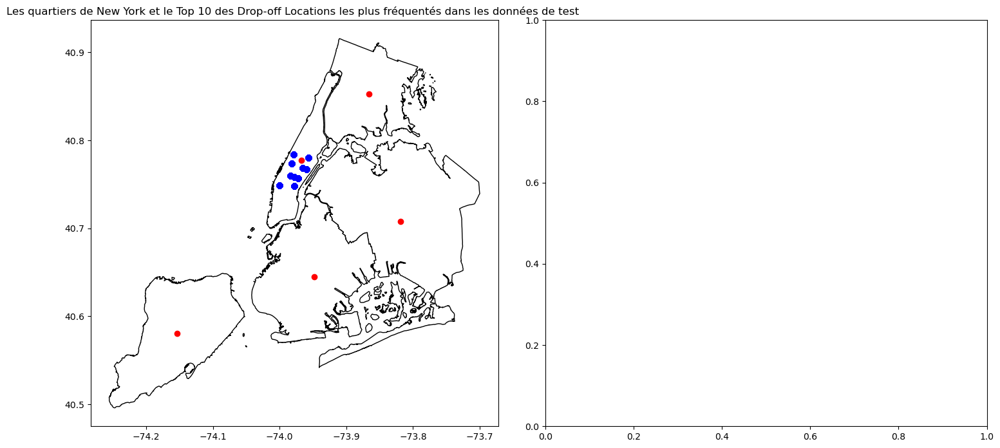

In [84]:
#On a remarqué que y a beaucoup de drop-off à Manhattan dans le top des dropoff les plus fréquentés du X_test





top10_counts = gdf_test_do_all['geometry'].value_counts().head(10)
top10_points = gdf_test_do_all[gdf_test_do_all['geometry'].isin(top10_counts.index)]

boro_locations = boros.copy()
boro_locations['geometry'] = boros.centroid  


fig, ax = plt.subplots(1, 2, figsize=(15, 7))

boros.plot(ax=ax[0], color="white", edgecolor="black")
boro_locations.plot(ax=ax[0], color="red", marker="o")
top10_points.plot(ax=ax[0], color="blue", marker="o", alpha=0.6)
ax[0].set_title("Les quartiers de New York et le Top 10 des Drop-off Locations les plus fréquentés dans les données de test ") #
"""
# Second plot : les 10 points les plus fréquents
boros.plot(ax=ax[0], color="white", edgecolor="black")

ax[1].set_title("")

#
"""
plt.tight_layout()

plt.show()

In [85]:
# Jetons un oeil sur les 10 endroits les conocernés par les pickup
pu_all = X_test[['PU_location_lat', 'PU_location_lon']]
geometry_pu_all = [Point(xy) for xy in zip(pu_all['PU_location_lon'], pu_all['PU_location_lat'])]
gdf_test_pu_all = gpd.GeoDataFrame(pu_all, geometry=geometry_pu_all, crs="EPSG:4326")

# Compter les 10 valeurs les plus fréquentes
top10_counts = gdf_test_pu_all['geometry'].value_counts().head(10)



In [86]:
top10_points = gdf_test_pu_all[gdf_test_pu_all['geometry'].isin(top10_counts.index)]


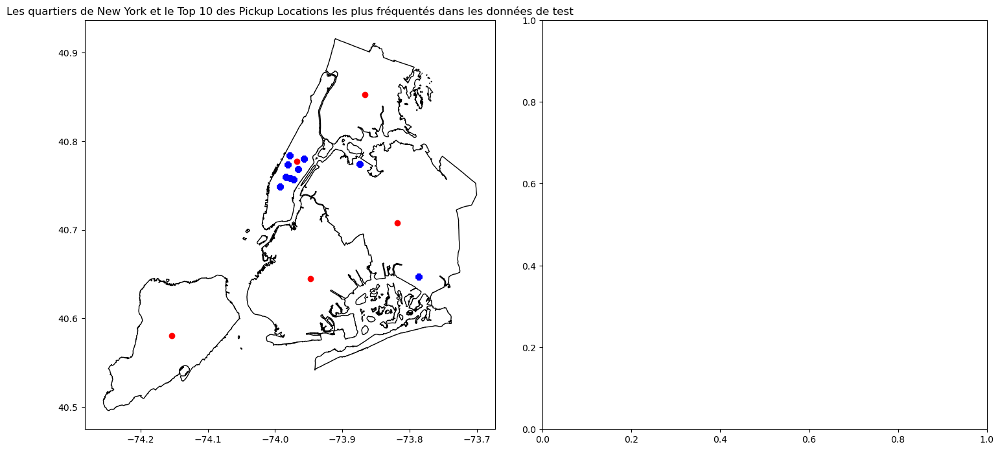

In [87]:

fig, ax = plt.subplots(1, 2, figsize=(15, 7))

boros.plot(ax=ax[0], color="white", edgecolor="black")
boro_locations.plot(ax=ax[0], color="red", marker="o")
top10_points.plot(ax=ax[0], color="blue", marker="o", alpha=0.6)
ax[0].set_title("Les quartiers de New York et le Top 10 des Pickup Locations les plus fréquentés dans les données de test") #

plt.tight_layout()
plt.show()

#Manhattan, JFK et La Guardia Airport

In [88]:
#Manhattan limites [(40.7,-74.12),(40.83,-73.95)]

In [89]:
#Beaucoup de points drop-off à Manhattan et c'est dans la congestion zone 
#Sont-ils associés à des pourboires plus élevés
#Calculons le tip par km

#Montrer qu'ils ont des tips plus éleves en créant une colonne 'dropoff_Manhattan'


from geodatasets import get_path
path_to_file = get_path('nybb')


new_york_boroughs = gpd.read_file(path_to_file)  # exemple de dataset inclus avec geopandas
manhattan = new_york_boroughs[new_york_boroughs['BoroName'] == 'Manhattan']



In [90]:
# Définir les limites approximatives de Manhattan
min_lat, max_lat = 40.7, 40.83
min_lon, max_lon = -74.12, -73.95

# Création des colonnes pour indiquer si la prise en charge et la dépose sont dans Manhattan
X_train['PU_in_manhattan'] = X_train.apply(
    lambda row: int(min_lat <= row['PU_location_lat'] <= max_lat and min_lon <= row['PU_location_lon'] <= max_lon), axis=1
)
X_train['DO_in_manhattan'] = X_train.apply(
    lambda row: int(min_lat <= row['DO_location_lat'] <= max_lat and min_lon <= row['DO_location_lon'] <= max_lon), axis=1
)


In [91]:
X_train['in_manhattan']=X_train['PU_in_manhattan']*X_train['DO_in_manhattan']

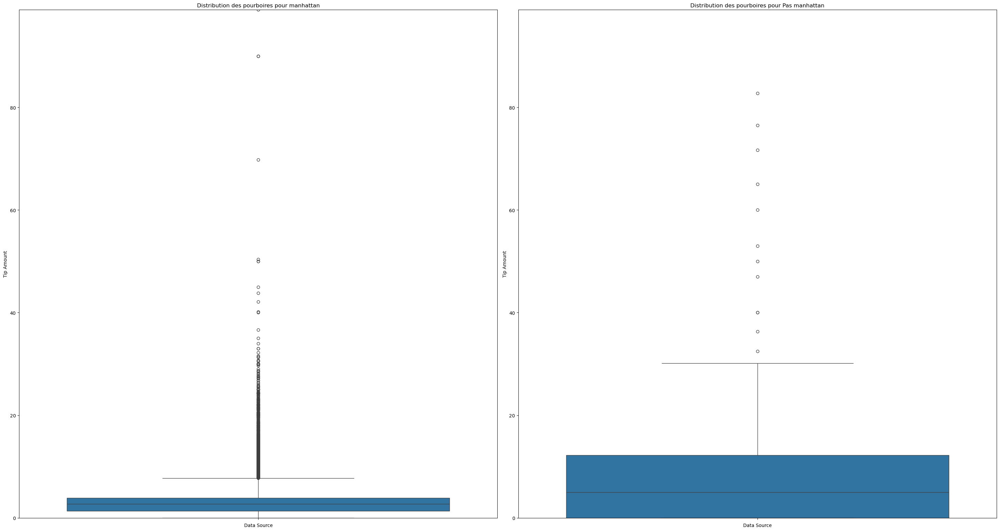

In [92]:

manhattan_trajet=X_train[X_train['PU_in_manhattan']==1]
no_manhattan_trajet=X_train[X_train['PU_in_manhattan']==0]

# Supposons que JFK et X_train sont déjà définis
fig, axes = plt.subplots(1, 2, figsize=(30, 16))
axes = axes.flatten()

# Liste des DataFrames à comparer
data_cmp = [manhattan_trajet,no_manhattan_trajet,X_train]

# Créer des boxplots pour chaque DataFrame
for i, ax in enumerate(axes):
    sns.boxplot(y='tip_amount', data=data_cmp[i], ax=ax)
    ax.set_title('Distribution des pourboires pour ' + (['manhattan', 'Pas manhattan'][i]))
    ax.set_ylabel('Tip Amount')
    ax.set_xlabel('Data Source')

# Définir des limites communes pour l'axe des ordonnées
y_min = min(data_cmp[1]['tip_amount'].min(), data_cmp[0]['tip_amount'].min())
y_max = max(data_cmp[1]['tip_amount'].max(), data_cmp[0]['tip_amount'].max())
for ax in axes:
    ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

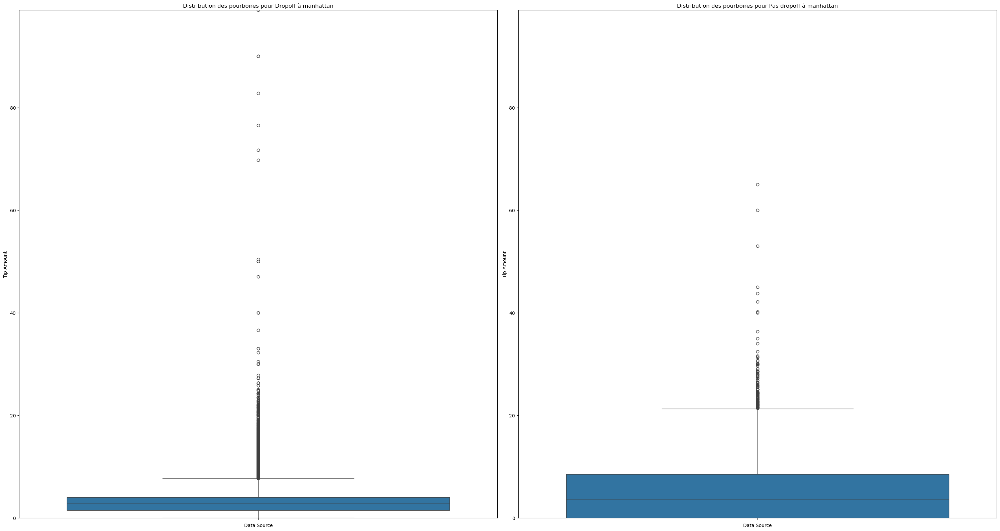

In [98]:
#Dans un premier les trajets dont la destination est Manhattan et après voir vite fait pour tous les trajets il

manhattan_trajet=X_train[X_train['DO_in_manhattan']==1]
no_manhattan_trajet=X_train[X_train['DO_in_manhattan']==0]


fig, axes = plt.subplots(1, 2, figsize=(30, 16))
axes = axes.flatten()

# Liste des DataFrames à comparer
data_cmp = [manhattan_trajet,no_manhattan_trajet,X_train]

# Créer des boxplots pour chaque DataFrame
for i, ax in enumerate(axes):
    sns.boxplot(y='tip_amount', data=data_cmp[i], ax=ax)
    ax.set_title('Distribution des pourboires pour ' + (['Dropoff à manhattan', 'Pas dropoff à manhattan'][i]))
    ax.set_ylabel('Tip Amount')
    ax.set_xlabel('Data Source')

# Définir des limites communes pour l'axe des ordonnées
y_min = min(data_cmp[1]['tip_amount'].min(), data_cmp[0]['tip_amount'].min())
y_max = max(data_cmp[1]['tip_amount'].max(), data_cmp[0]['tip_amount'].max())
for ax in axes:
    ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

In [129]:
X_train[X_train['PU_in_manhattan']==1]['tip_per_km'].mean()

2.070749600023057

In [131]:
X_train[X_train['PU_in_manhattan']==0]['tip_per_km'].mean()

2.1036776433753235

In [133]:
X_train[X_train['DO_in_manhattan']==1]['tip_per_km'].mean()

2.074320058913373

In [135]:
X_train[X_train['DO_in_manhattan']==0]['tip_per_km'].mean()

2.0773491246019957

In [103]:
X_train[X_train['in_manhattan']==1]['tip_per_km'].mean()

2.170793477303777

In [104]:
X_train[X_train['in_manhattan']==0]['tip_per_km'].mean()

1.6947745011764483

<Axes: ylabel='tip_amount'>

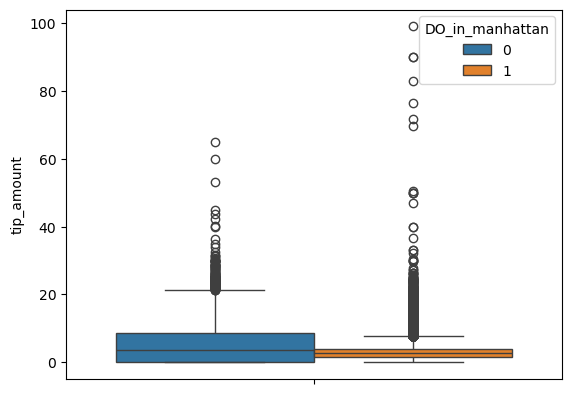

In [127]:
sns.boxplot(data=X_train, y="tip_amount", hue = "DO_in_manhattan")

manhattan.unary_union

In [ ]:
"""
# Aéroport JFK 
JFK=X_train.query('(1.0001*(-73.786530)<PU_location_lon < 0.9999*(-73.786530) and   0.9999*40.646985<PU_location_lat<1.0001*40.646985) or (1.0091*(-73.786530)<DO_location_lon < 0.9999*(-73.786530) and 0.9999*40.646985<DO_location_lat<1.0001*40.646985)')

#Aéroport La Guardia 
LGA=X_train.query('(1.0001*(-73.873628)<PU_location_lon < 0.9999*(-73.873628) and   0.9999*40.774376<PU_location_lat<1.0001*40.774376) or (1.0001*(-73.873628)<DO_location_lon < 0.9999*(-73.873628) and 0.9999*40.774376<DO_location_lat<1.0001*40.774376)')

#Aéroport La Guardia
NWK=X_train.query('(1.0005*(-74.17400)<PU_location_lon < 0.9995*(-74.17400) and   0.9995*40.691830<PU_location_lat<1.0005*40.691830) or (1.0005*(-74.17400)<DO_location_lon < 0.9995*(-74.17400) and 0.9995*40.691830<DO_location_lat<1.0005*40.691830)')

# Transformer le DataFrame X_train en GeoDataFrame avec des Points
# pour les coordonnées de départ et d'arrivée
#X_train['PU_location'] = X_train.apply(lambda row: Point(row['PU_location_lon'], row['PU_location_lat']), axis=1)
#X_train['DO_location'] = X_train.apply(lambda row: Point(row['DO_location_lon'], row['DO_location_lat']), axis=1)
"""